In [1]:
import datetime
import pandas as pd
import sklearn
import numpy as np

pd.set_option("display.max_colwidth", 0)
pd.set_option("display.max_rows", 500)
pd.set_option("display.max_columns", 500)
pd.set_option("display.width", 1000)
import warnings
warnings.filterwarnings("ignore")
pd.options.display.float_format = '{:.5f}'.format

In [2]:
%%time

# load features and target for ML
df_traffic = pd.read_csv('output/austin_2022_GP_10min_interval_delaydifference_with_features_forML_final.csv')
df_traffic = df_traffic.rename(columns={"miles": "segment_length"})

df_traffic['minutes_since_midnight'] = df_traffic['hour_min'].apply(lambda x: int(x[:2]) * 60 + int(x[3:]))
df_traffic = df_traffic[df_traffic['tmc_code']!='112+53808']  # this is a segment disconnected with every road

print('unique road segments (samples):',df_traffic.tmc_code.unique().shape[0])
print('total observations: ',df_traffic.shape[0])
# because the event usually begins in the morning after 10, people arrive typically around that time, so we want to only focus on after 930
df_traffic = df_traffic[df_traffic['minutes_since_midnight']>=540]
print(df_traffic.shape[0]) #866449

# Merge with graph embeddings of road network
df_road_embeddings = pd.read_csv('output/network_embeddings.csv')
suffixes = [int(col.split('_')[-1]) for col in df_road_embeddings.columns if col.startswith('embedding_')]
max_embeddings = max(suffixes) if suffixes else None
df_traffic = df_traffic.merge(df_road_embeddings, how='left')
print(df_traffic.shape[0])
df_traffic.head(2)

unique road segments (samples): 3223
total observations:  3547722
2196629
2196629
CPU times: user 11.7 s, sys: 4.1 s, total: 15.8 s
Wall time: 15.8 s


,tmc_code,hour_min,delay_baseline,delay_focus,delay_difference,date,intersection,start_latitude,start_longitude,end_latitude,end_longitude,segment_length,airbnb_count,distance_to_venue_centroid,distance_to_Shuttle_Waterloo_Park,distance_to_Shuttle_Barton_Creek_Square,distance_to_Shuttle_Expo_Center,segment_bearing,osm_id,road_type,oneway,lanes_mean,maxspeed_value,day_of_week,no_devices,no_devices_baseline,no_devices_focus,demand_diff,minutes_since_midnight,embedding_0,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,embedding_11,embedding_12,embedding_13,embedding_14,embedding_15,embedding_16,embedding_17,embedding_18,embedding_19,embedding_20,embedding_21,embedding_22,embedding_23,embedding_24,embedding_25,embedding_26,embedding_27,embedding_28,embedding_29,embedding_30,embedding_31,embedding_32,embedding_33,embedding_34,embedding_35,embedding_36,embedding_37,embedding_38,embedding_39,embedding_40,embedding_41,embedding_42,embedding_43,embedding_44,embedding_45,embedding_46,embedding_47,embedding_48,embedding_49,embedding_50,embedding_51,embedding_52,embedding_53,embedding_54,embedding_55,embedding_56,embedding_57,embedding_58,embedding_59,embedding_60,embedding_61,embedding_62,embedding_63
0,112+04760,09:00,-1.06365,-1.30941,-0.24577,2022-10-17,US-183/EXIT 239-240,30.32874,-97.70568,30.33272,-97.70402,0.29287,49,26.64241,7.39988,14.41580,10.33789,19.79829,"[122981397, 1012363973]66847798019339769835",secondary,True,1.50000,55.00000,0,0.00000,132.00000,108.00000,-24.00000,540,0.80788,-0.30878,0.48830,0.40444,-0.19644,-0.63592,-0.05096,-0.96207,-0.26387,0.54659,-1.03205,-0.57319,0.58703,-0.90266,0.39712,0.64467,0.02475,-0.13640,-0.42769,0.39307,0.45515,0.69224,0.02814,-0.87651,-0.46587,-0.28346,-0.03728,-0.89838,-0.87812,-0.60183,0.24631,-0.66729,0.74725,-0.08435,0.21258,0.50216,-0.85987,-0.10462,0.10216,-0.61296,0.70476,-0.07447,-0.44610,-1.25291,-0.56601,0.08196,0.06211,0.14970,0.23362,-0.72179,0.71536,0.29920,-0.47497,-0.78599,-0.12997,-0.19213,-0.19580,-0.42946,-1.18347,0.54779,-0.78096,0.16931,0.24326,-0.44661
1,112+04760,09:00,-1.06365,-1.30941,-0.24577,2022-10-17,US-183/EXIT 239-240,30.32874,-97.70568,30.33272,-97.70402,0.29287,49,26.64241,7.39988,14.41580,10.33789,19.79829,"[122981397, 1012363973]66847798019339769835",secondary,True,1.50000,55.00000,0,0.00000,132.00000,33.00000,-99.00000,540,0.80788,-0.30878,0.48830,0.40444,-0.19644,-0.63592,-0.05096,-0.96207,-0.26387,0.54659,-1.03205,-0.57319,0.58703,-0.90266,0.39712,0.64467,0.02475,-0.13640,-0.42769,0.39307,0.45515,0.69224,0.02814,-0.87651,-0.46587,-0.28346,-0.03728,-0.89838,-0.87812,-0.60183,0.24631,-0.66729,0.74725,-0.08435,0.21258,0.50216,-0.85987,-0.10462,0.10216,-0.61296,0.70476,-0.07447,-0.44610,-1.25291,-0.56601,0.08196,0.06211,0.14970,0.23362,-0.72179,0.71536,0.29920,-0.47497,-0.78599,-0.12997,-0.19213,-0.19580,-0.42946,-1.18347,0.54779,-0.78096,0.16931,0.24326,-0.44661


# Filtering data

In [43]:
_param_day_of_week = 5 # 5: Saturday, 6: Sunday
_param_morning_or_evening = 'evening' # 'evening', 'morning'
print(datetime.datetime.now(),'Day: ',_param_day_of_week,_param_morning_or_evening)

2025-02-19 09:24:33.941952 Day:  5 evening


In [5]:
df_traffic = df_traffic[df_traffic['day_of_week']==_param_day_of_week]

print(df_traffic.shape[0])

# select two focused time period for training a ML model
if _param_morning_or_evening == 'morning':
    df_traffic = df_traffic[(df_traffic['minutes_since_midnight']>=10*60)&(df_traffic['minutes_since_midnight']<=12*60)] 
elif _param_morning_or_evening == 'evening':
    df_traffic = df_traffic[(df_traffic['minutes_since_midnight']>=17*60)&(df_traffic['minutes_since_midnight']<=20*60)] 
print(df_traffic.shape[0])

289890
61199


In [6]:
# load network data
df_road = pd.read_csv("data/TMC_Identification.csv", sep=',', header=0)
df_road = df_road[['tmc_code','intersection','start_latitude','start_longitude','end_latitude','end_longitude','miles']]
from shapely.geometry import LineString
from geopandas import GeoDataFrame

df_road['geometry'] = df_road.apply(
    lambda row: LineString([(row['start_longitude'], row['start_latitude']),
                             (row['end_longitude'], row['end_latitude'])]),
    axis=1
)
gdf_road = GeoDataFrame(df_road, geometry='geometry',crs="EPSG:4326")
gdf_road.head(2)

,tmc_code,intersection,start_latitude,start_longitude,end_latitude,end_longitude,miles,geometry
0,112P13033,W MARTIN LUTHER KING JR BLVD,30.28172,-97.74193,30.28232,-97.74207,0.04249,"LINESTRING (-97.74193 30.28172, -97.74207 30.28232)"
1,112+08908,FM-20,30.11066,-97.41049,30.11082,-97.37323,2.22783,"LINESTRING (-97.41049 30.11066, -97.37323 30.11082)"


# Mapping no of devices (optional)

In [6]:
df_traffic_vis = df_traffic[['tmc_code','date','hour_min','delay_difference','no_devices_focus']]
gdf_road_merged = gdf_road.merge(df_traffic_vis)
gdf_road_merged.shape[0]

2197949

In [7]:
%%time
date1 = '2022-10-21'
hour_min1 = '13:20'

gdf_road_merged_select = gdf_road_merged[(gdf_road_merged['date']==date1)&(gdf_road_merged['hour_min']==hour_min1)]
print(gdf_road_merged_select.shape[0])
gdf_road_merged_select.explore(
    column='no_devices_focus'
)

3223


# Load the fine-tuned ML model

In [7]:
feature_names = ['minutes_since_midnight', 'segment_length','segment_bearing', 'oneway', 'lanes_mean','road_type', 'maxspeed_value',
                'airbnb_count', 'distance_to_venue_centroid', 'no_devices_baseline', 'no_devices_focus'
               ] #'no_devices' , 'day_of_week', 

feature_names.extend([f"embedding_{i}" for i in range(max_embeddings)])

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Prepare input features and labels for the model
X = df_traffic[feature_names].copy() 
X['road_type'] = X['road_type'].astype('category')
y = df_traffic['delay_difference'].values

In [8]:
%%time 
import lightgbm as lgb
import joblib

# Load the model back
output_path = './output/day_5evening_lightgbm_2025-02-14 18:52:12.265256.pkl'
model = joblib.load(output_path)
print("Model loaded successfully!")
# print(model.feature_name_)

Model loaded successfully!
CPU times: user 1.14 s, sys: 0 ns, total: 1.14 s
Wall time: 169 ms


In [9]:
%%time
import numpy as np
from sklearn.metrics import mean_squared_log_error
from sklearn.metrics import mean_squared_error, r2_score

y_pred = model.predict(X)

mse = mean_squared_error(y, y_pred)
rmse = np.sqrt(mse)
print(datetime.datetime.now(),'Best Model RMSE: %.3f' % rmse)

r2 = r2_score(y, y_pred)
print(datetime.datetime.now(),'Best Model R-squared: %.3f' % r2) 

[LightGBM] [Warning] feature_fraction is set=0.7788744249702235, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7788744249702235
[LightGBM] [Warning] lambda_l2 is set=1.5758475312005116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5758475312005116
[LightGBM] [Warning] lambda_l1 is set=0.919513128729248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.919513128729248
[LightGBM] [Warning] bagging_fraction is set=0.9219048697670043, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9219048697670043
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
2025-02-14 18:52:50.157930 Best Model RMSE: 7.260
2025-02-14 18:52:50.159276 Best Model R-squared: 0.631
CPU times: user 2.06 s, sys: 1.84 ms, total: 2.06 s
Wall time: 243 ms


# Simulation
## First, check the performance of the prediction model on the whole dataset

In [94]:
# dayofweek = 4
# X_select = X[X['day_of_week']==dayofweek]
# print(X_select.shape[0])

In [10]:
%%time
y_pred_select = model.predict(X)
# X_select['predicted_diff_delay'] = y_pred_select
# df_traffic_select = df_traffic.copy()
df_traffic['predicted_diff_delay'] = y_pred_select
print(df_traffic.shape[0])

[LightGBM] [Warning] feature_fraction is set=0.7788744249702235, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7788744249702235
[LightGBM] [Warning] lambda_l2 is set=1.5758475312005116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5758475312005116
[LightGBM] [Warning] lambda_l1 is set=0.919513128729248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.919513128729248
[LightGBM] [Warning] bagging_fraction is set=0.9219048697670043, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9219048697670043
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
61199
CPU times: user 2 s, sys: 5.97 ms, total: 2.01 s
Wall time: 203 ms


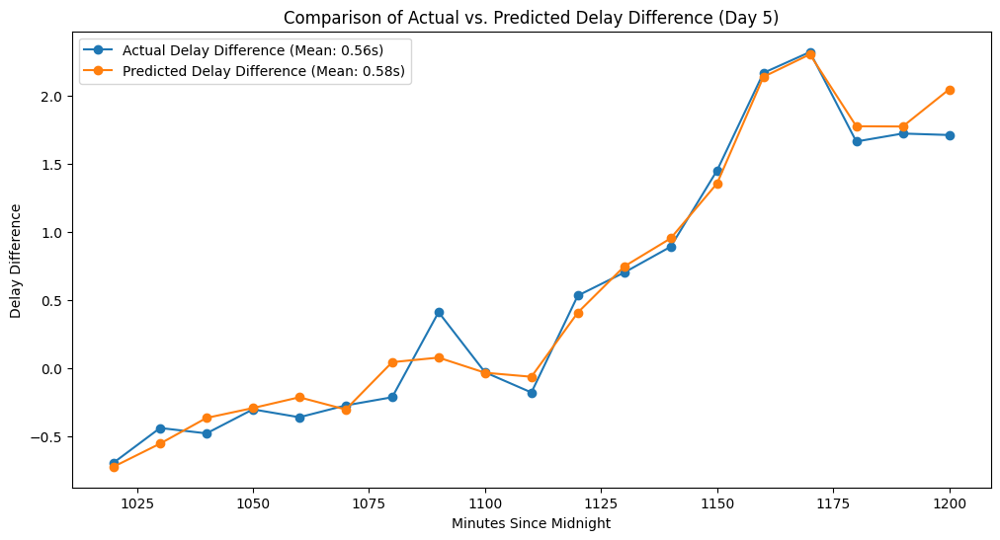

In [11]:
import matplotlib as plt
from matplotlib import pyplot
import matplotlib.pyplot as plt

# Compute mean values
mean_actual = df_traffic['delay_difference'].mean()
mean_predicted = df_traffic['predicted_diff_delay'].mean()

# Plot the trends
ax = df_traffic[['minutes_since_midnight', 'delay_difference', 'predicted_diff_delay']] \
    .groupby('minutes_since_midnight').mean() \
    .plot(figsize=(12, 6), marker='o', linestyle='-')

# Add labels and title
plt.xlabel("Minutes Since Midnight")
plt.ylabel("Delay Difference")
plt.title("Comparison of Actual vs. Predicted Delay Difference (Day " + str(_param_day_of_week) + ")")
# plt.grid(True)

# Update legend with mean values
plt.legend([
    f"Actual Delay Difference (Mean: {mean_actual:.2f}s)",
    f"Predicted Delay Difference (Mean: {mean_predicted:.2f}s)"
])

plt.show()

In [35]:
## This is an example reducing travel demand globally to a half and explore the results of delay differences
# X_select_simu = X_select.copy()
# print(X_select_simu.no_devices_focus.describe())
# X_select_simu['no_devices_focus'] = X_select_simu['no_devices_focus']/2
# print(X_select_simu.no_devices_focus.describe())

# y_pred_simu = model.predict(X_select_simu)
# df_traffic_simu = df_traffic[df_traffic['day_of_week']== dayofweek]
# df_traffic_simu['predicted_diff_delay'] = y_pred_simu
# print(df_traffic_simu.shape[0])

In [34]:
# # Compute mean values
# mean_actual = df_traffic_simu['delay_difference'].mean()
# mean_predicted = df_traffic_simu['predicted_diff_delay'].mean()

# # Plot the trends
# ax = df_traffic_simu[['minutes_since_midnight', 'delay_difference', 'predicted_diff_delay']] \
#     .groupby('minutes_since_midnight').mean() \
#     .plot(figsize=(12, 6), marker='o', linestyle='-')

# # Add labels and title
# plt.xlabel("Minutes Since Midnight")
# plt.ylabel("Delay Difference")
# plt.title("Comparison of Actual vs. Predicted Delay Difference (Friday Oct 21, 2022)")
# # plt.grid(True)

# # Update legend with mean values
# plt.legend([
#     f"Actual Delay Difference (Mean: {mean_actual:.2f}s)",
#     f"Predicted Delay Difference (Mean: {mean_predicted:.2f}s)"
# ])

# plt.show()

# Search the overlapping hexagon for each road segment by spatial join

In [12]:
from shapely.geometry import box
import geopandas as gpd
import h3pandas

bound_lat = [30.039047,30.584984]
bound_lon = [-97.996048, -97.389445]
austin_box = gpd.GeoDataFrame(geometry=[box(bound_lon[0],bound_lat[0],bound_lon[1],bound_lat[1])],crs="EPSG:4326")
# austin_box.plot()

resolution = 6 # Average edge length: 3.7km
# H3 resolution list: https://h3geo.org/docs/core-library/restable/
hexagons = austin_box.h3.polyfill_resample(resolution)
# ax = hexagons.plot(figsize=(5, 5), cm"ap='RdBu')
hexagons.drop(['index'], axis=1, inplace=True)
gdf_hexagon = gpd.GeoDataFrame(hexagons, crs="EPSG:4326", geometry='geometry')

In [13]:
road_segments_with_hexagon = gpd.sjoin_nearest(
    gdf_hexagon,
    gdf_road,
    how='left',  # Use 'left' to ensure all road segments are preserved
)
df_hexagon_list = road_segments_with_hexagon[['tmc_code']].reset_index()
df_hexagon_list.head(2)

,h3_polyfill,tmc_code
0,86489e04fffffff,112-06351
1,86489e28fffffff,112+13349


In [51]:
# Only look at the road segments near the venue
hexagons_near_venue = ['86489e327ffffff', '86489e32ffffff', '86489e307ffffff']
road_filter_venue = df_hexagon_list[df_hexagon_list['h3_polyfill'].isin(hexagons_near_venue)].tmc_code.tolist()
road_filter_venue.extend(['112N15305','112+17005','112-17004','112+13339'])

In [8]:
# m = gdf_hexagon.explore(
# )
# gdf_road.explore(
#     m=m,
#     color='red'
# )

In [56]:
# df_hexagon_list.h3_polyfill.unique().shape[0]

86

# Simulation: reduce travel demand within a specific hexagon and compare the delay diff

## First, if we randomly changing travel demand

In [52]:
import math

print(df_traffic.shape[0])
df_traffic_w_hexagon = df_traffic.merge(df_hexagon_list, how='left')
print(df_traffic_w_hexagon.shape[0])
print(df_traffic_w_hexagon.h3_polyfill.unique().shape[0])

unique_hexagon_list = df_traffic_w_hexagon.h3_polyfill.unique().tolist()
unique_hexagon_list = [x for x in unique_hexagon_list if not (isinstance(x, float) and math.isnan(x))]
print(len(unique_hexagon_list))

61199
69293
75
74


In [40]:
# %%time 

# import random

# # _param_demand_size_factor = 1/2 # reduce half travel demand
# total_mean_list, total_std_list = [],[]

# for _param_demand_size_factor in np.arange(0.1, 1.1, 0.1): # varing demand factors
#     # if _param_demand_size_factor > 0.2:break
#     print(datetime.datetime.now(),'_param_demand_size_factor: ',_param_demand_size_factor)

#     mean_list, std_list = [], []
#     i = 0
#     # for hex_id in random.sample(unique_hexagon_list, df_traffic_w_hexagon.h3_polyfill.unique().shape[0]): # loop hexagons
#     for hex_id in unique_hexagon_list: # loop hexagons
#         i+=1
#         if i%10 == 0: print(datetime.datetime.now(),i,'/',df_traffic_w_hexagon.h3_polyfill.unique().shape[0],'total iterations')
            
#         road_filter = df_hexagon_list[df_hexagon_list['h3_polyfill']==hex_id].tmc_code.tolist() # these are the road segments we want to simulate reducing demand
#         X_simu = X.copy()
#         # print(X_select_simu.no_devices_focus.describe())
        
#         df_traffic_simu = df_traffic.copy()
#         df_traffic_simu.loc[df_traffic_simu['tmc_code'].isin(road_filter), 'no_devices_focus'] *= _param_demand_size_factor
#         X_simu['no_devices_focus'] = df_traffic_simu['no_devices_focus'] # manualy overwrite travel demand in one hexagon
#         # print(X_select_simu.no_devices_focus.describe())
        
#         y_pred_simu = model.predict(X_simu)
#         mean_list.append(np.mean(y_pred_simu))
#         # std_list.append(np.std(y_pred_simu))

#     total_mean_list.append(mean_list)
#     # total_std_list.append(std_list)

In [41]:
# df_total_simulation = pd.DataFrame(total_mean_list).T
# df_total_simulation.head()

In [42]:
# import seaborn as sns

# sns.set_theme(style="ticks", rc={'figure.figsize': (6, 6)}, font_scale=1.2)
# ax = sns.boxplot(data=df_total_simulation, palette="husl", showfliers=False, showmeans=True,
#                  meanprops={"marker": "^", "markerfacecolor": "white", "markeredgecolor": "black", "markersize": 10})
# plt.xlabel("Travel demand reduction ratio", fontsize=16)
# plt.ylabel("Predicted delay difference (s)", fontsize=14)
# plt.title('Predicted delay difference \n for the whole network')
# ax.set_xticklabels([0.9,0.8,0.7,0.6,0.5,0.4,0.3,0.2,0.1,0])
# plt.gca().invert_xaxis()
# plt.show()
# # plt.savefig('./output/change_localness_percent.pdf', bbox_inches='tight')

In [54]:
%%time 

total_mean_venue_list = []

for _param_demand_size_factor in np.arange(0.1, 1.1, 0.1): # varing demand factors
    print(datetime.datetime.now(),'_param_demand_size_factor: ',_param_demand_size_factor)

    mean_list = []
    i = 0
    for hex_id in unique_hexagon_list: # loop all hexagons
        i+=1
        if i%10 == 0: print(datetime.datetime.now(),i,'/',df_traffic_w_hexagon.h3_polyfill.unique().shape[0],'total iterations')
            
        road_filter = df_hexagon_list[df_hexagon_list['h3_polyfill']==hex_id].tmc_code.tolist() # these are the road segments we want to simulate reducing demand
        
        X_simu = X.copy()
        df_traffic_simu = df_traffic.copy()
        df_traffic_simu.loc[df_traffic_simu['tmc_code'].isin(road_filter), 'no_devices_focus'] *= _param_demand_size_factor
        X_simu['no_devices_focus'] = df_traffic_simu['no_devices_focus'] # manualy overwrite travel demand in one hexagon
        # print(X_select_simu.no_devices_focus.describe())
        
        y_pred_simu = model.predict(X_simu)
        df_traffic_simu['simulated_diff_delay'] = y_pred_simu

        # print(df_traffic_simu[df_traffic_simu['tmc_code'].isin(road_filter_venue)].simulated_diff_delay.sum())
        # mean_list.append(df_traffic_simu[df_traffic_simu['tmc_code'].isin(road_filter_venue)].simulated_diff_delay.mean())
        mean_list.append(df_traffic_simu[df_traffic_simu['tmc_code'].isin(road_filter_venue)].groupby('tmc_code').simulated_diff_delay.mean().sum())
        
    total_mean_venue_list.append(np.mean(mean_list))
print(total_mean_venue_list)

2025-02-19 09:37:24.377537 _param_demand_size_factor:  0.1
[LightGBM] [Warning] feature_fraction is set=0.7788744249702235, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7788744249702235
[LightGBM] [Warning] lambda_l2 is set=1.5758475312005116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5758475312005116
[LightGBM] [Warning] lambda_l1 is set=0.919513128729248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.919513128729248
[LightGBM] [Warning] bagging_fraction is set=0.9219048697670043, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9219048697670043
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.7788744249702235, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7788744249702235
[LightGBM] [Warning] lambda_l2 is set=1.5758475312005116, reg_lambda=0.0 will be ignored. Current value: lambda_l

In [65]:
total_mean_venue_list=[606.5357802755585, 606.6488080617178, 606.7999369112399, 607.1115791898342, 607.0949613644606, 607.1267391662838, 607.2755902039349, 607.4926784048203, 607.6003617094188, 607.8042057822473]


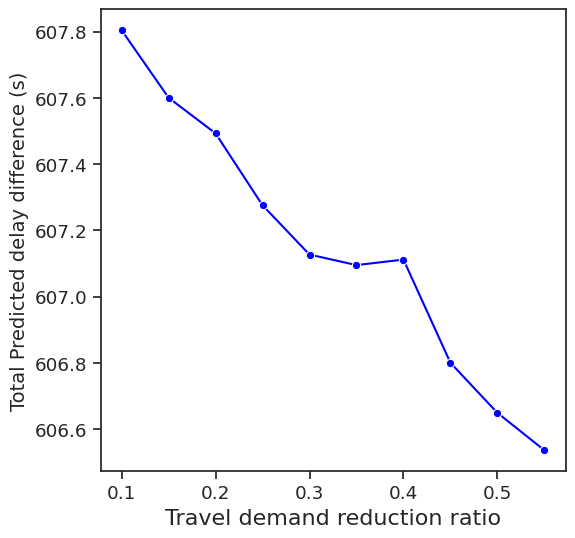

In [66]:
# Data (replace this with your actual y-values)
x_values = [0.9,0.8,0.7,0.6,0.5,0.4,0.3,0.2,0.1,0]  # X-axis: Percentage reduction in travel demand
y_values = total_mean_venue_list  # Y-axis: Predicted delay difference (replace with actual data)

# Set the theme for the plot
sns.set_theme(style="ticks", rc={'figure.figsize': (6, 6)}, font_scale=1.2)

# Create the line plot
ax = sns.lineplot(x=x_values, y=y_values, marker="o", color="blue")

# Labels and Title
plt.xlabel("Travel demand reduction ratio", fontsize=16)
plt.ylabel("Total Predicted delay difference (s)", fontsize=14)
ax.set_xticklabels([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])
# plt.title('Average predicted delay difference \n for the segments near the venue')
# plt.gca().invert_xaxis()
plt.show()
# plt.savefig('./output/change_localness_percent.pdf', bbox_inches='tight')

## Second, if we vary travel demand according to top OD

In [16]:
df_traj = pd.read_pickle("./data/cuebiq/texas_traj_20221021_20221023.pkl")

df_traj['start_zoned_datetime'] = pd.to_datetime(df_traj['start_zoned_datetime'],errors='coerce', utc=True)
df_traj['start_zoned_datetime'] = df_traj['start_zoned_datetime'].dt.tz_convert('America/Chicago')
df_traj['hour'] = df_traj['start_zoned_datetime'].dt.hour
df_traj['day_of_week'] = df_traj['start_zoned_datetime'].dt.weekday

# print(df_traj.shape[0])
# print(df_traj.cuebiq_id.unique().shape[0])
# print(np.sort(df_traj['hour'].unique()))
df_traj = df_traj[df_traj['day_of_week']==_param_day_of_week]

if _param_morning_or_evening == 'morning':
    df_traj = df_traj[(df_traj['hour']>=10)&(df_traj['hour']<=12)]
    print(df_traj.shape[0])
elif _param_morning_or_evening == 'evening':
    df_traj = df_traj[(df_traj['hour']>=17)&(df_traj['hour']<=20)]
    print(df_traj.shape[0])

df_traj_need = df_traj[['cuebiq_id', 'start_lat', 'start_lng', 'end_lat', 'end_lng']]
df_traj_need    

8260


,cuebiq_id,start_lat,start_lng,end_lat,end_lng
79,5926848846,30.24720,-97.58255,29.91395,-96.21791
83,5900838360,32.88056,-117.23241,32.88426,-117.24316
84,5900838360,32.88426,-117.24316,32.90208,-117.24460
85,5900838360,32.90208,-117.24460,32.88557,-117.24044
86,5900838360,32.88557,-117.24044,32.87066,-117.21217
...,...,...,...,...,...
98264,5330929551,30.32553,-97.70499,30.32407,-97.70560
98274,5351018317,30.12923,-97.63776,30.14260,-97.62574
98275,5351018317,30.14260,-97.62574,30.21381,-97.74952
98284,6046412281,30.13403,-97.63394,30.13534,-97.63202


In [17]:
import geopandas as gpd
from shapely.geometry import Point

geometry = [Point(lon, lat) for lon, lat in zip(df_traj_need['start_lng'], df_traj_need['start_lat'])]
gdf_origin = gpd.GeoDataFrame(df_traj_need, geometry=geometry)
geometry = [Point(lon, lat) for lon, lat in zip(df_traj_need['end_lng'], df_traj_need['end_lat'])]
gdf_destination = gpd.GeoDataFrame(df_traj_need, geometry=geometry)

gdf_joined_origin = gpd.sjoin(gdf_origin, gdf_hexagon, how="inner")
gdf_joined_destination = gpd.sjoin(gdf_destination, gdf_hexagon, how="inner")

In [18]:
# turn into OD dataframe
gdf_joined_origin = gdf_joined_origin.rename(columns={'h3_polyfill': 'origin_h3_polyfill'})
gdf_joined_destination = gdf_joined_destination.rename(columns={'h3_polyfill': 'destination_h3_polyfill'})
df_od = gdf_joined_origin[['cuebiq_id', 'start_lat', 'start_lng', 'end_lat', 'end_lng', 'origin_h3_polyfill']].merge(gdf_joined_destination[['cuebiq_id', 'start_lat', 'start_lng', 'end_lat', 'end_lng', 'destination_h3_polyfill']])
print(df_od.shape[0])

df_od_sum = df_od.groupby(['origin_h3_polyfill', 'destination_h3_polyfill']).size().reset_index(name='count')

6656


In [21]:
import h3

hexagons_near_venue = ['86489e327ffffff', '86489e32ffffff', '86489e307ffffff'] # these three hexagons are near the venue
df_od_to_venue = df_od_sum[df_od_sum['origin_h3_polyfill'].isin(hexagons_near_venue)]
df_od_to_venue = df_od_to_venue.sort_values(by="count",ascending=False)

def h3_to_latlng(h3_id):
    return h3.h3_to_geo(h3_id)

df_od_to_venue["origin_lat"], df_od_to_venue["origin_lng"] = zip(*df_od_to_venue["origin_h3_polyfill"].apply(h3_to_latlng))
df_od_to_venue["destination_lat"], df_od_to_venue["destination_lng"] = zip(*df_od_to_venue["destination_h3_polyfill"].apply(h3_to_latlng))
df_od_to_venue.head(10)

,origin_h3_polyfill,destination_h3_polyfill,count,origin_lat,origin_lng,destination_lat,destination_lng
368,86489e327ffffff,86489e327ffffff,1939,30.11835,-97.64947,30.11835,-97.64947
371,86489e327ffffff,86489e347ffffff,485,30.11835,-97.64947,30.27655,-97.76681
365,86489e327ffffff,86489e307ffffff,302,30.11835,-97.64947,30.17356,-97.61721
377,86489e327ffffff,86489e377ffffff,133,30.11835,-97.64947,30.22383,-97.72765
374,86489e327ffffff,86489e35fffffff,93,30.11835,-97.64947,30.33177,-97.73455
285,86489e307ffffff,86489e307ffffff,91,30.17356,-97.61721,30.17356,-97.61721
359,86489e327ffffff,86489e277ffffff,91,30.11835,-97.64947,30.38695,-97.70226
373,86489e327ffffff,86489e357ffffff,88,30.11835,-97.64947,30.27904,-97.69539
375,86489e327ffffff,86489e367ffffff,67,30.11835,-97.64947,30.22131,-97.79905
369,86489e327ffffff,86489e32fffffff,53,30.11835,-97.64947,30.17110,-97.68854


In [45]:
top_origin = df_od_to_venue[df_od_to_venue['count']>50].destination_h3_polyfill.tolist()
# top_origin_filtered = [x for x in top_origin if x not in hexagons_near_venue]
top_origin_filtered = [x for x in top_origin]
print(top_origin_filtered)

['86489e327ffffff', '86489e347ffffff', '86489e307ffffff', '86489e377ffffff', '86489e35fffffff', '86489e307ffffff', '86489e277ffffff', '86489e357ffffff', '86489e367ffffff', '86489e32fffffff', '86489eae7ffffff']


In [45]:
# # optional mapping
# from shapely.geometry import Polygon, LineString
# from keplergl import KeplerGl

# df_hex = df_od_to_venue.groupby("origin_h3_polyfill")["count"].sum().reset_index()
# df_hex.columns = ["hex_id", "trip_count"]

# map_1 = KeplerGl(height=600)
# map_1.add_data(data=df_od_to_venue[df_od_to_venue['count']>50], name="OD Flows")
# map_1.add_data(data=df_hex, name="Hexagon Layer")
# map_1

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'OD Flows': {'index': [431, 479, 371, 570, 369, 524, 508, 451], 'columns': ['origin_h3_polyfill…

In [30]:
# %%time 
# total_mean_venue_list = []

# df_traffic_new = df_traffic.copy()
# for _param_demand_size_factor in np.arange(0.1, 1.1, 0.1): # varing demand factors
#     _param_demand_size_factor = round(_param_demand_size_factor,1)
#     print(datetime.datetime.now(),'_param_demand_size_factor: ',_param_demand_size_factor)

#     mean_list = []
            
#     X_simu = X.copy()
#     # print(X_select_simu.no_devices_focus.describe())
        
#     df_traffic_simu = df_traffic.copy()
#     df_traffic_simu.loc[df_traffic_simu['tmc_code'].isin(road_filter_venue), 'no_devices_focus'] *= _param_demand_size_factor
#     X_simu['no_devices_focus'] = df_traffic_simu['no_devices_focus'] # manualy overwrite travel demand in one hexagon
#     # print(X_select_simu.no_devices_focus.describe())
        
#     y_pred_simu = model.predict(X_simu)

#     col_new = 'simulated_diff_delay_' + str(round(_param_demand_size_factor,1))
#     df_traffic_new[col_new] = y_pred_simu
#     # mean_list.append(df_traffic_simu[df_traffic_simu['tmc_code'].isin(road_filter_venue)].simulated_diff_delay.mean())
#     # total_mean_venue_list.append(np.mean(mean_list))

2025-02-14 19:07:10.952500 _param_demand_size_factor:  0.1
[LightGBM] [Warning] feature_fraction is set=0.7788744249702235, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7788744249702235
[LightGBM] [Warning] lambda_l2 is set=1.5758475312005116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5758475312005116
[LightGBM] [Warning] lambda_l1 is set=0.919513128729248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.919513128729248
[LightGBM] [Warning] bagging_fraction is set=0.9219048697670043, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9219048697670043
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
2025-02-14 19:07:11.163085 _param_demand_size_factor:  0.2
[LightGBM] [Warning] feature_fraction is set=0.7788744249702235, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7788744249702235
[LightGBM] [Warning] lambda_l2 is set=1.57584753120051

In [56]:
%%time 
# Vary all hexagons with highest travel demand

total_mean_venue_list = []

df_traffic_new = df_traffic.copy()
for _param_demand_size_factor in np.arange(0.1, 1.1, 0.1): # varing demand factors
    _param_demand_size_factor = round(_param_demand_size_factor,1)
    print(datetime.datetime.now(),'_param_demand_size_factor: ',_param_demand_size_factor)

    mean_list = []
    df_traffic_simu = df_traffic.copy()
    
    for hex_id in top_origin_filtered: # loop all top five hexagons
        road_filter = df_hexagon_list[df_hexagon_list['h3_polyfill']==hex_id].tmc_code.tolist() # these are the road segments we want to simulate reducing demand
        df_traffic_simu.loc[df_traffic_simu['tmc_code'].isin(road_filter), 'no_devices_focus'] *= _param_demand_size_factor

    X_simu = X.copy()
    X_simu['no_devices_focus'] = df_traffic_simu['no_devices_focus'] # manualy overwrite travel demand in one hexagon
    # print(X_select_simu.no_devices_focus.describe())
        
    y_pred_simu = model.predict(X_simu)
    col_new = 'simulated_diff_delay_' + str(round(_param_demand_size_factor,1))
    df_traffic_new[col_new] = y_pred_simu

2025-02-19 09:40:02.652251 _param_demand_size_factor:  0.1
[LightGBM] [Warning] feature_fraction is set=0.7788744249702235, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7788744249702235
[LightGBM] [Warning] lambda_l2 is set=1.5758475312005116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5758475312005116
[LightGBM] [Warning] lambda_l1 is set=0.919513128729248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.919513128729248
[LightGBM] [Warning] bagging_fraction is set=0.9219048697670043, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9219048697670043
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
2025-02-19 09:40:02.891625 _param_demand_size_factor:  0.2
[LightGBM] [Warning] feature_fraction is set=0.7788744249702235, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7788744249702235
[LightGBM] [Warning] lambda_l2 is set=1.57584753120051

In [57]:
df_traffic_new_focus = df_traffic_new[df_traffic_new['tmc_code'].isin(road_filter_venue)]
for col in df_traffic_new_focus.columns:
    if col.startswith("simulated_diff_delay") and col != 'predicted_diff_delay':
        new_col = col + '_ratio'
        df_traffic_new_focus[new_col] = (df_traffic_new_focus[col] - df_traffic_new_focus['predicted_diff_delay']) / df_traffic_new_focus['predicted_diff_delay']

In [33]:
# df_traffic_new_focus

In [58]:
feature_need1 = ['tmc_code'] #,'delay_difference','predicted_diff_delay'
feature_need1.extend([f"simulated_diff_delay_{round(i,1)}" for i in np.arange(0.1, 1.1, 0.1)])

df_groupby1 = df_traffic_new_focus[feature_need1].groupby(['tmc_code']).mean().reset_index()
# print(df_groupby1.delay_difference.sum())
# print(df_groupby1.predicted_diff_delay.sum())
total_delay_list1 = []
for col in feature_need1:
    if col!='tmc_code':
        total_delay_list1.append(df_groupby1[col].sum())
print(len(total_delay_list1))
print(total_delay_list1)

10
[570.0076491560985, 565.1039621781342, 555.0645862537544, 563.3123453054569, 564.2741917479625, 567.9608199082676, 571.0467702635917, 572.7329630432728, 583.6984603717468, 607.8042057822473]


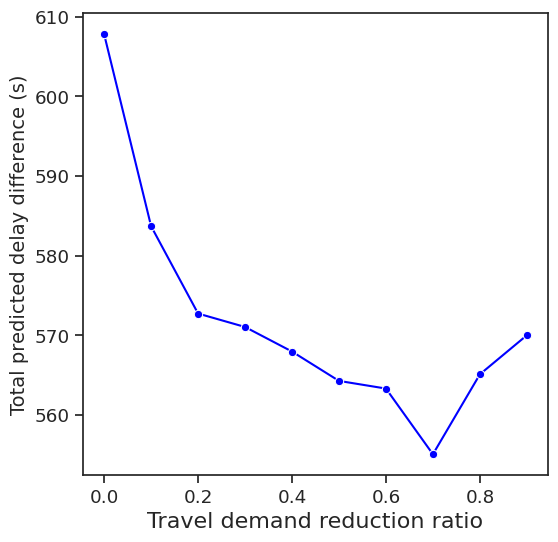

In [61]:
import seaborn as sns

x_values = [0.9,0.8,0.7,0.6,0.5,0.4,0.3,0.2,0.1,0]  # X-axis: Percentage reduction in travel demand
y_values = total_delay_list1  # Y-axis: Predicted delay difference (replace with actual data)

sns.set_theme(style="ticks", rc={'figure.figsize': (6, 6)}, font_scale=1.2)
ax = sns.lineplot(x=x_values, y=y_values, marker="o", color="blue")
plt.xlabel("Travel demand reduction ratio", fontsize=16)
plt.ylabel("Total predicted delay difference (s)", fontsize=14)
plt.show()
# ax.set_xticklabels([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])
# plt.title('Total predicted delay difference \n for the segments near the venue')
# plt.gca().invert_xaxis()
# plt.savefig('./output/change_localness_percent.pdf', bbox_inches='tight')

[606.5357802755585, 606.6488080617178, 606.7999369112399, 607.1115791898342, 607.0949613644606, 607.1267391662838, 607.2755902039349, 607.4926784048203, 607.6003617094188, 607.8042057822473] [570.0076491560985, 565.1039621781342, 555.0645862537544, 563.3123453054569, 564.2741917479625, 567.9608199082676, 571.0467702635917, 572.7329630432728, 583.6984603717468, 607.8042057822473]


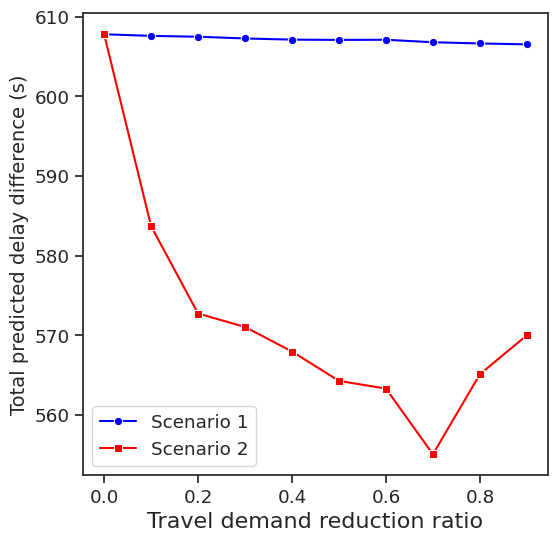

In [67]:
import seaborn as sns
import matplotlib.pyplot as plt

# Given data
x_values = [0.9, 0.8, 0.7, 0.6, 0.5, 0.4, 0.3, 0.2, 0.1, 0]  
y_values1 = total_mean_venue_list  # First trend line
y_values2 = total_delay_list1  # Second trend line
print(y_values1, y_values2)

# Set theme and figure size
sns.set_theme(style="ticks", rc={'figure.figsize': (6, 6)}, font_scale=1.2)

# Plot first trend line
ax = sns.lineplot(x=x_values, y=y_values1, marker="o", color="blue", label="Scenario 1")

# Plot second trend line
sns.lineplot(x=x_values, y=y_values2, marker="s", color="red", label="Scenario 2")

# Labels and title
plt.xlabel("Travel demand reduction ratio", fontsize=16)
plt.ylabel("Total predicted delay difference (s)", fontsize=14)

# Show legend
plt.legend()

# Show plot
plt.show()


In [87]:
df_changes_trend = df_traffic_new_focus[df_traffic_new_focus['simulated_diff_delay_0.1_ratio']!=0]

feature_need = ['tmc_code','date','minutes_since_midnight','delay_difference','predicted_diff_delay']
feature_need.extend([f"simulated_diff_delay_{round(i,1)}_ratio" for i in np.arange(0.1, 1.1, 0.1)])

df_changes_trend = df_changes_trend[feature_need]
df_changes_trend.head(2)

,tmc_code,date,minutes_since_midnight,delay_difference,predicted_diff_delay,simulated_diff_delay_0.1_ratio,simulated_diff_delay_0.2_ratio,simulated_diff_delay_0.3_ratio,simulated_diff_delay_0.4_ratio,simulated_diff_delay_0.5_ratio,simulated_diff_delay_0.6_ratio,simulated_diff_delay_0.7_ratio,simulated_diff_delay_0.8_ratio,simulated_diff_delay_0.9_ratio,simulated_diff_delay_1.0_ratio
246440,112+13338,2022-10-22,600,3.33448,14.11352,-0.51338,-0.49707,-0.38093,-0.40767,-0.31227,-0.33959,-0.03565,-0.31897,-0.41124,0.00000
246441,112+13338,2022-10-22,610,24.35496,11.66043,-0.41504,-0.39530,-0.25473,-0.33516,-0.33516,-0.32518,0.04270,-0.30021,-0.48783,0.00000


In [ ]:
df_changes_trend.groupby(['tmc_code'])

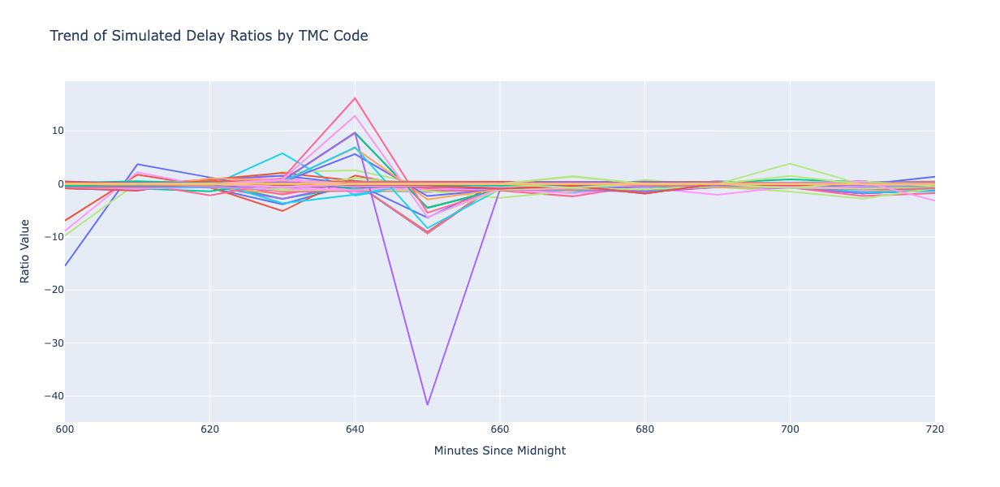

In [88]:
import plotly.graph_objects as go
import pandas as pd

simulated_columns = [col for col in df_changes_trend.columns if col.startswith('simulated_diff_delay')]

# Create a plotly figure
fig = go.Figure()

# Iterate through unique tmc_code values
for tmc in df_changes_trend['tmc_code'].unique():
    # Filter data for the current tmc_code
    tmc_data = df_changes_trend[df_changes_trend['tmc_code'] == tmc]
    
    # Plot each of the simulated columns for the current tmc_code
    for col in simulated_columns:
        fig.add_trace(go.Scatter(
            x=tmc_data['minutes_since_midnight'],
            y=tmc_data[col],
            mode='lines',
            # name=f'{tmc} - {col}',  # This will show up in the legend
            hovertemplate=f'TMC Code: {tmc}',  # Interactive hover text
            line=dict(width=2),
            showlegend=False 
        ))

# Add title and labels
fig.update_layout(
    title='Trend of Simulated Delay Ratios by TMC Code',
    xaxis_title='Minutes Since Midnight',
    yaxis_title='Ratio Value',
    hovermode='closest',  # Hover over the closest point
    height=600,  # Set custom height
    width=1000  # Set custom width
)

# Show the interactive plot
fig.show()

In [89]:
list_change_segment_id = df_changes_trend.tmc_code.unique().tolist()
print(len(list_change_segment_id))
gdf_road_focus = gdf_road[gdf_road['tmc_code'].isin(road_filter_venue)]
# gdf_road_focus = gdf_road[gdf_road['tmc_code'].isin(list_change_segment_id)]

15


# Show focused road segments

In [90]:
m1 = gdf_road.explore(color='gray')

gdf_road_focus.explore(
    m=m1,
    tiles="CartoDB positron",
    color='red',
)

# Archive

In [ ]:
# # Filter columns starting with 'simulated_diff_delay'
# simulated_columns = [col for col in df_changes_trend.columns if col.startswith('simulated_diff_delay')]

# # Create a plot
# plt.figure(figsize=(10, 6))

# # Iterate through unique tmc_code values
# for tmc in df_changes_trend['tmc_code'].unique():
#     # Filter data for the current tmc_code
#     tmc_data = df_changes_trend[df_changes_trend['tmc_code'] == tmc]
    
#     # Plot each of the simulated columns for the current tmc_code
#     for col in simulated_columns:
#         plt.plot(tmc_data['minutes_since_midnight'], tmc_data[col], label=f'{tmc} - {col}')

# # Add title, labels, and legend
# plt.title('Trend of Simulated Delay Ratios by TMC Code')
# plt.xlabel('Minutes Since Midnight')
# plt.ylabel('Ratio Value')
# # plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))

# # Show the plot
# plt.tight_layout()
# plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


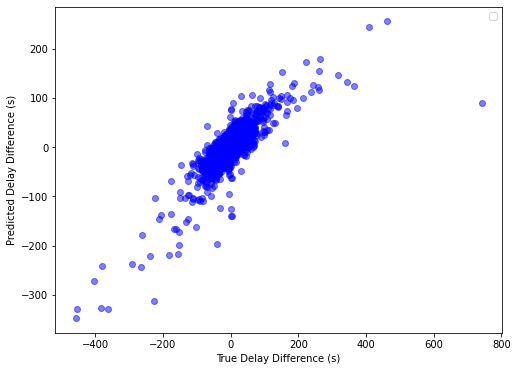

In [84]:
# Create the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(df_traffic['delay_difference'], df_traffic['predicted_diff_delay'], color='b', alpha=0.5)
# mean_diff_time = df_compare['diff_time'].mean()
# plt.axhline(y=mean_diff_time, color='r', linestyle='--', label=f'Mean delay: {mean_diff_time:.2f} min')

# Add labels and title
plt.xlabel('True Delay Difference (s)')
plt.ylabel('Predicted Delay Difference (s)')
# plt.title(f'n={df_compare.shape[0]} trips ({df_compare.cuebiq_id.unique().shape[0]} unique individuals)')
plt.legend()
plt.show()

Text(0.5, 0, 'Distance to venue (km)')

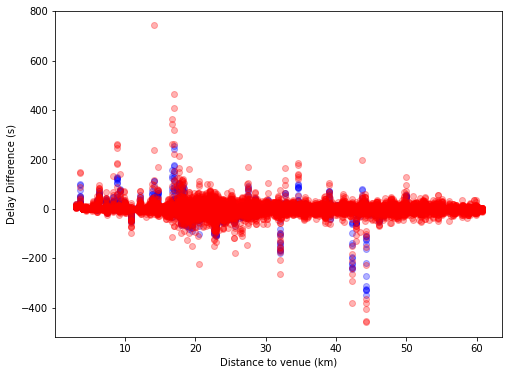

In [90]:
plt.figure(figsize=(8, 6))
df_traffic = df_traffic[df_traffic['distance_to_venue_centroid']<500]
plt.scatter( df_traffic['distance_to_venue_centroid'], df_traffic['predicted_diff_delay'], color='b', alpha=0.3)
plt.scatter( df_traffic['distance_to_venue_centroid'], df_traffic['delay_difference'], color='r', alpha=0.3)
plt.ylabel('Delay Difference (s)')
plt.xlabel('Distance to venue (km)')

In [85]:
# plt.figure(figsize=(8, 6))

# min_val = min(df_traffic.delay_difference.min(), df_traffic['predicted_diff_delay'].min())
# max_val = max(df_traffic.delay_difference.max(), df_traffic['predicted_diff_delay'].max())

# # Define common bin edges (adjust the number of bins as needed)
# bins = np.linspace(min_val, max_val, 300)  # 30 bins spanning the range of both datasets

# # Plot histograms with the same bins
# plt.figure(figsize=(8, 6))
# df_traffic.delay_difference.hist(alpha=0.5, bins=bins, color='blue', label='Actual Delay Difference')
# df_traffic['predicted_diff_delay'].hist(alpha=0.5, bins=bins, color='orange', label='Predicted Delay Difference')

# # Set x-axis limits (optional)
# plt.xlim(-50, 50)

# # Add labels and title
# plt.xlabel("Delay Difference")
# plt.ylabel("Frequency")
# plt.title("Overlayed Histograms of Actual vs Predicted Delay Difference")
# plt.legend()

In [64]:
# # Compute mean values
# mean_actual = df_traffic_simu['delay_difference'].mean()
# mean_predicted = df_traffic_simu['predicted_diff_delay'].mean()

# # Plot the trends
# ax = df_traffic_simu[['minutes_since_midnight', 'delay_difference', 'predicted_diff_delay']] \
#     .groupby('minutes_since_midnight').mean() \
#     .plot(figsize=(12, 6), marker='o', linestyle='-')

# # Add labels and title
# plt.xlabel("Minutes Since Midnight")
# plt.ylabel("Delay Difference")
# plt.title("Comparison of Actual vs. Predicted Delay Difference (Friday Oct 21, 2022)")
# # plt.grid(True)

# # Update legend with mean values
# plt.legend([
#     f"Actual Delay Difference (Mean: {mean_actual:.2f}s)",
#     f"Predicted Delay Difference (Mean: {mean_predicted:.2f}s)"
# ])

# plt.show()